# Task 2_Phát hiện vùng ứng viên biển báo (Color + Region + Edge, hợp nhất bằng NMS)

- **Mục tiêu:** Task 2 phát hiện các vùng có khả năng là biển báo giao thông bằng 3 kỹ thuật xử lý ảnh độc lập, sau đó hợp nhất kết quả để tối đa hoá recall. 

- **Input / Output:**
    - Input: Ảnh đã qua tiền xử lý (Median Blur + Dynamic CLAHE) từ Task 1
    - Output: Danh sách bounding box`(x, y, w, h) cho mỗi ảnh, lưu dạng JSON  dùng làm đầu vào cho Task 4 (ROI extraction). 

- **3 kỹ thuật độc lập được hợp nhất:**
    1. **HSV color thresholding**: Ngưỡng màu đỏ/vàng/lam trên không gian HSV (tách biệt màu sắc khỏi độ sáng, ổn định hơn RGB dưới điều kiện chiếu sáng thay đổi).
    2. **MSER (Maximally Stable Extremal Regions):** Phát hiện vùng ổn định theo độ tương phản với nền, không phụ thuộc màu sắc, bắt được cả biển trắng/đen mà HSV bỏ sót.
    3. **Canny Edge + Convex Hull:** Phát hiện biên, dilate để nối các đoạn biên bị đứt do Canny, dùng Convex Hull vá contour vỡ.
    4. **NMS theo IoU:** Hợp nhất 3 nguồn box, loại box trùng lặp giữa các phương pháp.

- **Nguyên tắc thiết kế:** Ưu tiên **recall** ở bước này (chấp nhận nhiều box nhiễu/dương tính giả), vì độ chính xác (precision) sẽ được xử lý ở tầng phân loại HOG + SVM (Task 6-7).

- **Quy trình thực hiện:**
  1. Đọc ảnh đã qua Task 1, chuyển BGR -> HSV.
  2. Khảo sát sơ bộ 3 bộ ngưỡng HSV (Set 1/2/3).
  3. Xây dựng 3 nhánh box độc lập: HSV / MSER / Edge+Hull.
  4. Hợp nhất bằng NMS (IoU-based), visualize so sánh.
  5. Đánh giá định lượng recall/precision (IoU với Ground Truth) trên 100 ảnh — so sánh HSV đơn lẻ và Union.
  6. Áp dụng lên toàn bộ dataset, xuất box JSON cho Task 5.
  7. Lưu tham số đã chọn vào `config.yaml`.


# Mô tả cách đánh giá định lượng

**Nguyên tắc đánh giá Recall/Precision dựa trên IoU:**
**IoU (Intersection over Union)** là tỷ lệ giữa diện tích phần giao và diện tích phần hợp của hai bounding box, dùng để đo mức độ trùng khớp không gian giữa box dự đoán (predicted box) và box nhãn thật (ground-truth box):

$$IoU(B_{pred}, B_{gt}) = \frac{Area(B_{pred} \cap B_{gt})}{Area(B_{pred} \cup B_{gt})}$$

- IoU = 1: hai box trùng khớp hoàn toàn.
- IoU = 0: hai box không giao nhau.

**Nguyên tắc match (ghép cặp) box dự đoán với ground-truth:**
1. Với mỗi ảnh, tính IoU giữa **mọi box dự đoán** và **mọi box ground-truth**.
2. Một cặp (predicted, ground-truth) được coi là **match đúng (True Positive)** nếu IoU giữa chúng >= ngưỡng IoU quy định (`iou_thresh`), thường lấy **0.5** theo quy ước phổ biến (PASCAL VOC).
3. Mỗi ground-truth chỉ được match với **tối đa 1** predicted box (tránh đếm trùng): nếu nhiều box dự đoán cùng đạt IoU ≥ ngưỡng với 1 ground-truth, chỉ box có IoU cao nhất được tính là match.
4. Ground-truth không có box nào match -> **False Negative** (bỏ sót biển báo).
5. Predicted box không match với ground-truth nào -> **False Positive** (box nhiễu/dư thừa).

**Công thức tính Recall và Precision từ kết quả match:**

$$Recall = \frac{TP}{TP + FN} = \frac{\text{Số ground-truth được phát hiện}}{\text{Tổng số ground-truth}}$$

$$Precision = \frac{TP}{TP + FP} = \frac{\text{Số box dự đoán đúng}}{\text{Tổng số box dự đoán}}$$

**Áp dụng trong Task 2 (giai đoạn sinh candidate box):**
- Mục tiêu ưu tiên là **Recall cao**, chấp nhận sinh nhiều box (kể cả box nhiễu/dương tính giả) miễn không bỏ sót biển báo thật, vì bước lọc Precision sẽ do tầng 1 phân loại SVM đảm nhiệm.
- Do đó, khi so sánh các phương pháp (HSV theo từng Set, MSER theo từng `delta`, Canny theo từng cặp ngưỡng, và cuối cùng là Union NMS), tiêu chí lựa chọn hàng đầu là **Recall**, còn **Precision thấp và số box/ảnh cao** được xem là đánh đổi chấp nhận được ở giai đoạn này.
- Việc đánh giá được thực hiện trên **100 ảnh mẫu ngẫu nhiên** (`random.seed(42)`) để đảm bảo tính tái lập (reproducibility) và giảm chi phí tính toán so với chạy trên toàn bộ 2.532 ảnh, đồng thời vẫn đại diện đủ tốt cho phân bố dữ liệu chung.

Cách tính này (hàm `match_boxes` / `evaluate_boxes`) được tái sử dụng nhất quán ở các mục khảo sát tiếp theo (6.2. Khảo sát Canny, 7.2. So sánh từng nhánh với Union NMS), nhằm đảm bảo các con số Recall/Precision có thể so sánh trực tiếp với nhau qua các bước.

# 1. Import thư viện

In [5]:
import os
import sys
import cv2
import json
import numpy as np
import yaml
import matplotlib.pyplot as plt
from pathlib import Path


# 2. Thiết lập đường dẫn

In [6]:
CURRENT_DIR = Path.cwd()
PROJECT_ROOT = CURRENT_DIR.parent if CURRENT_DIR.name == "notebooks" else CURRENT_DIR
sys.path.append(str(PROJECT_ROOT))

from src.data_loader import load_config, get_image_dirs

CFG, PROJECT_ROOT, CONFIG_PATH = load_config(PROJECT_ROOT)
IMAGE_DIR, LABEL_DIR = get_image_dirs(CFG, PROJECT_ROOT)

PROCESSED_IMAGE_DIR = PROJECT_ROOT / "data" / "processed" / "task1_preprocessing" / "images"

OUTPUT_DIR = PROJECT_ROOT / CFG["paths"]["outputs"]
FIGURE_DIR = OUTPUT_DIR / "figures" / "task2"
FIGURE_DIR.mkdir(parents=True, exist_ok=True)

print("PROCESSED_IMAGE_DIR:", PROCESSED_IMAGE_DIR)

PROCESSED_IMAGE_DIR: c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task1_preprocessing\images


# 3. Tải 5 ảnh mẫu (đã qua xử lý ở Task 1)

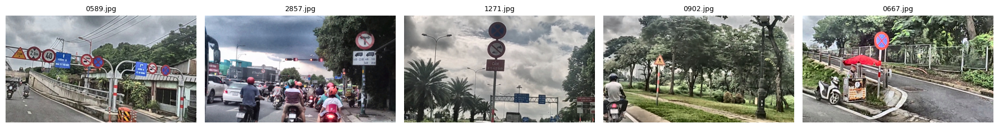

In [7]:
from src.utils import show_images

QUALITATIVE_JSON_PATH = PROJECT_ROOT / "data" / "interim" / "qualitative_check_images.json"

assert QUALITATIVE_JSON_PATH.exists(), (
    f"Không tìm thấy {QUALITATIVE_JSON_PATH}. Hãy chạy mục '5 ảnh ngẫu nhiên cố định' "
    f"trong 01_task1_preprocessing.ipynb trước."
)

with open(QUALITATIVE_JSON_PATH, "r", encoding="utf-8") as f:
    sample_names = json.load(f)

survey_paths  = [PROCESSED_IMAGE_DIR / name for name in sample_names]
survey_images = [cv2.imread(str(p)) for p in survey_paths]
survey_titles = [p.name for p in survey_paths]

for p in survey_paths:
    assert p.exists(), f"Không tìm thấy: {p}"

show_images(survey_images, survey_titles, figsize=(18, 5))

# 4. Khảo sát bộ ngưỡng HSV (Set 1/2/3)

# 4.1. Khảo sát định tính trên tập ảnh mẫu

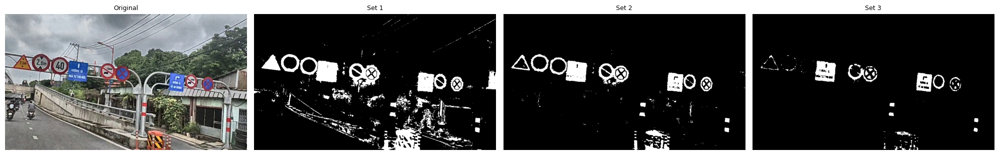

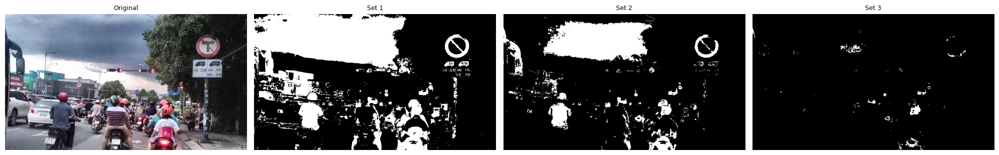

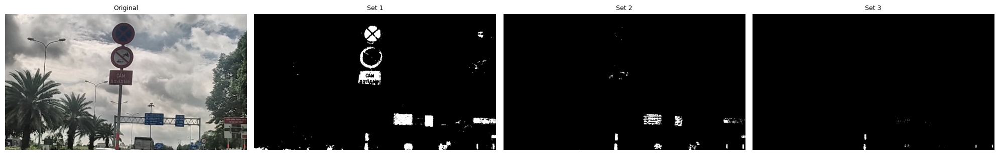

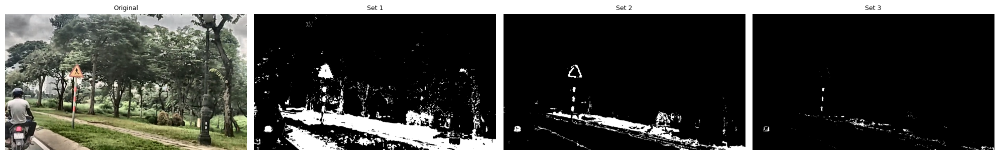

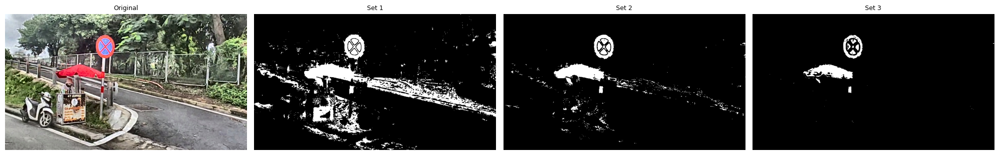

In [8]:
from src.segmentation import get_hsv_ranges, generate_combined_mask

survey_hsv = [cv2.cvtColor(img, cv2.COLOR_BGR2HSV) for img in survey_images]
set_numbers = [1, 2, 3]

for img_bgr, img_hsv, title in zip(survey_images, survey_hsv, survey_titles):
    mask_list = []
    for set_num in set_numbers:
        ranges = get_hsv_ranges(set_num)
        combined, _, _, _ = generate_combined_mask(img_hsv, ranges)
        mask_list.append(combined)

    show_images(
        [img_bgr] + mask_list,
        ["Original"] + [f"Set {s}" for s in set_numbers],
        figsize=(20, 5)
    )

**Nhận xét:**
- Mức độ nhiễu giảm dần theo thứ tự Set 1 > Set 2 > Set 3.
- **Set 1 (dải rộng):** Nhiễu nhiều nhất. Ảnh bầu trời âm u, tán cây, tường nhà, quần áo, mặt đường... đều bị lẫn vào mask trắng. Nếu dùng sẽ sinh ra nhiều box rác.
- **Set 2 (dải tiêu chuẩn):** Nhiễu giảm rõ so với Set 1, hình dạng biển báo (vòng tròn, tam giác, hình chữ nhật xanh) còn giữ được nét khá rõ ràng và liền khối. Tuy nhiên vẫn còn sót một ít nhiễu nền (cây, vệt sáng, vài mảng quần áo/xe) nhưng không nghiêm trọng.
- **Set 3 (dải hẹp):** Sạch nhất, gần như loại bỏ hết background nhưng đổi lại nguy cơ mất luôn cả biên báo, đặc biệt ở các ảnh biển báo ở xa.



## 4.2. Khảo sát định lượng recall/precision (IoU) trên 100 ảnh mẫu ngẫu nhiên

In [9]:
from src.utils import read_label_boxes, match_boxes, evaluate_boxes, print_eval_table, draw_boxes, show_images, boxes_xywh_to_xyxy
from src.data_loader import list_image_paths
from src.task2_union import hsv_boxes

import random

random.seed(42)
eval_paths = random.sample(list_image_paths(PROCESSED_IMAGE_DIR), 100)

results = {
    f"Set {s}": evaluate_boxes(eval_paths, LABEL_DIR, lambda img, s=s: hsv_boxes(img, set_number=s))
    for s in set_numbers
}
print_eval_table(results)

Phuong an              | Recall (IoU>=0.3)    | Precision    | Avg box/anh    | So anh co GT
-------------------------------------------------------------------------------------------------
Set 1                  | 0.4031               | 0.0674       | 15.59          | 99
Set 2                  | 0.2054               | 0.0679       | 7.89           | 99
Set 3                  | 0.0543               | 0.0601       | 2.35           | 99


**Kết luận:** Chọn **Set 1** làm bộ ngưỡng HSV chính thức, mặc dù trùng bình box trên mỗi ảnh vẫn cao nhưng số recall lại là cao nhất nên vấn đề đó vẫn chấp nhận được
Bởi vì HSV vẫn nhạy với biển trắng/đen (biển cấm, biển tốc độ) và dễ nhiễu bởi đèn đường/đèn xe màu đỏ-vàng, nên đây lá lý do cần kết hợp thêm MSER và Edge+Hull ở bước Union, thay vì chỉ dùng riêng HSV.

In [10]:
selected_set = 1

with open(CONFIG_PATH, "r", encoding="utf-8") as f:
    cfg = yaml.safe_load(f)

cfg.setdefault("task2", {})
cfg["task2"]["hsv_set"] = selected_set
from src.data_loader import save_config
save_config(cfg, CONFIG_PATH)

print(f"Đã cập nhật config.yaml — task2: hsv_set = {selected_set} (chỉ dùng cho mask debug)")

Đã cập nhật config.yaml — task2: hsv_set = 1 (chỉ dùng cho mask debug)


# 5. Khảo sát tham số delta cho MSER

`delta` là tham số đặc trung nhất của MSER:
- delta nhỏ -> nhạy hơn, phát hiện nhiều vùng hơn nhưng dễ vỡ/trùng lặp
- delta lớn -> ít vùng hơn nhưng ổn định hơn

## 5.1. Khảo sát định tính trên tập ảnh mẫu

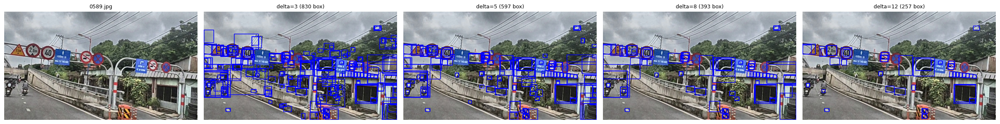

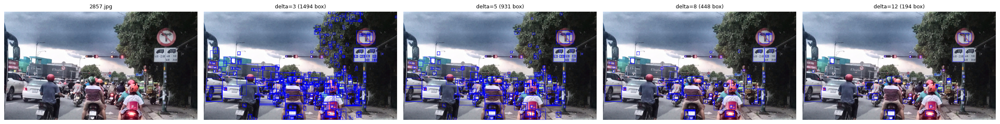

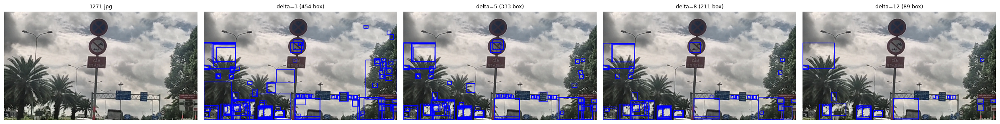

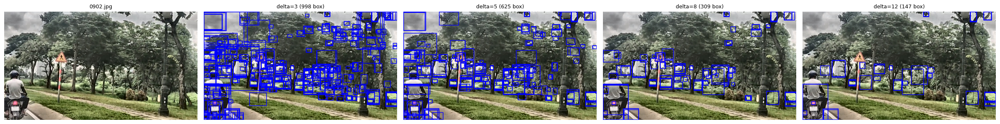

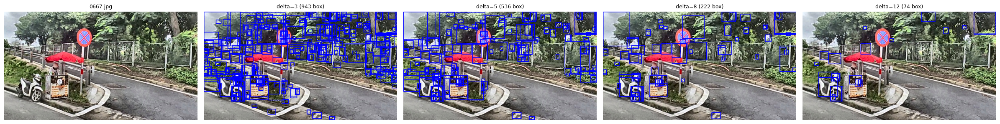

In [11]:
from src.task2_union import mser_boxes

delta_values = [3, 5, 8, 12]

for img_bgr, title in zip(survey_images, survey_titles):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (5, 5), 1.0)

    vis_list, titles_list = [img_bgr], [title]
    for delta in delta_values:
        boxes = mser_boxes(gray_blur, delta=delta)
        vis_list.append(draw_boxes(img_bgr, boxes, color=(255, 0, 0)))
        titles_list.append(f"delta={delta} ({len(boxes)} box)")

    show_images(vis_list, titles_list, figsize=(24, 5))

**Nhận xét:**
- delta = 3: Sinh ra nhiều box, , nhiều vùng ổn định giả bị tách vụn từ nền (lá cây, mảng tường loang màu)
- delta = 5 & delta = 8: Số box giảm, các vùng biển báo vẫn giữ được, ít nhiễu nền hơn.
- delta = 12: : Box giảm mạnh, có nguy cơ bỏ sót biển báo nhỏ/tương phản yếu

## 5.2. Khảo sát định lượng trong 100 tập ảnh ngẫu nhiên

In [12]:
def mser_fn(img, delta):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (5, 5), 1.0)
    return mser_boxes(gray_blur, delta=delta)

results = {
    f"delta={d}": evaluate_boxes(eval_paths, LABEL_DIR, lambda img, d=d: mser_fn(img, d))
    for d in delta_values
}
print_eval_table(results)

Phuong an              | Recall (IoU>=0.3)    | Precision    | Avg box/anh    | So anh co GT
-------------------------------------------------------------------------------------------------
delta=3                | 0.6977               | 0.0020       | 889.12         | 99
delta=5                | 0.6279               | 0.0030       | 542.82         | 99
delta=8                | 0.4767               | 0.0045       | 274.76         | 99
delta=12               | 0.2519               | 0.0054       | 121.77         | 99


**Nhận xét:**
- delta = 3 bị loại, mặc dù recall tốt nhưng có quá nhiều nhiễu box
- delta = 5 là cân bằng tốt nhất, recall vẫn ổn, giảm mạnh số box nhiễu
- delta = 8 & delta = 12 loại vì recall vừa thấp vừa có nguy cơ làm mất biển báo thật

# 6. Khảo sát tham số (low, high) cho Canny Edge + Convex Hull

## 6.1. Khảo sát định tính trên tập ảnh mẫu

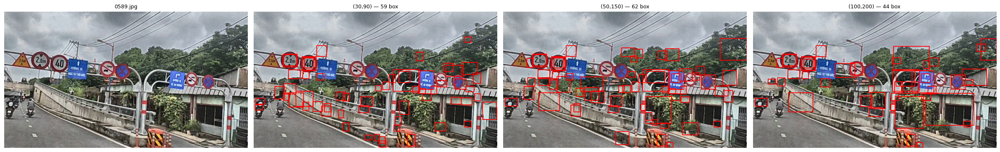

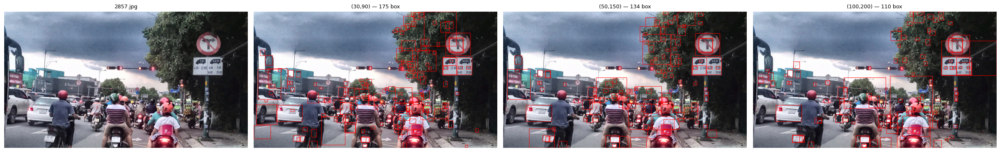

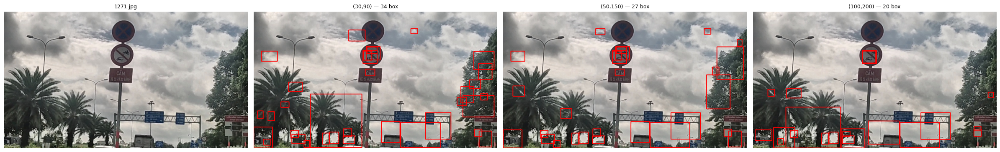

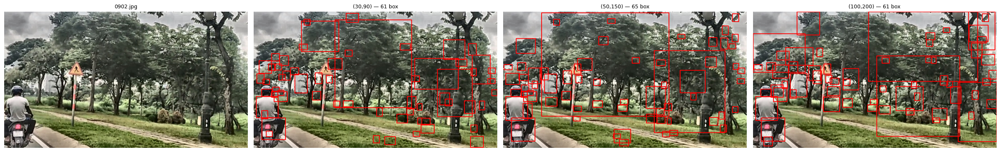

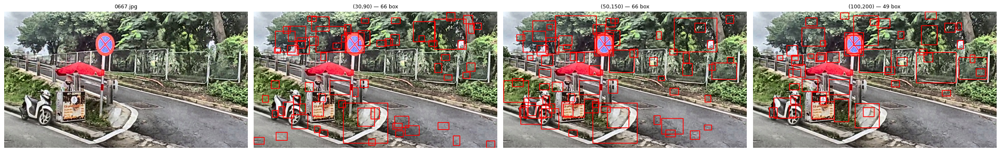

In [13]:
from src.task2_union import edge_shape_boxes_hull

canny_pairs = [(30, 90), (50, 150), (100, 200)]

for img_bgr, title in zip(survey_images, survey_titles):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (5, 5), 1.0)

    vis_list, titles_list = [img_bgr], [title]
    for low, high in canny_pairs:
        boxes = edge_shape_boxes_hull(gray_blur, low=low, high=high)
        vis_list.append(draw_boxes(img_bgr, boxes, color=(0, 0, 255)))
        titles_list.append(f"({low},{high}) — {len(boxes)} box")

    show_images(vis_list, titles_list, figsize=(24, 5))

**Nhận xét:**
- (30,90): Có nhiều box ở hầu hết các ảnh. Cạnh yếu bị giữ lại nhiều, dẫn tới tán lá câu, banner quảng cáo đều bị dilate+hull gộp thành hàng loạt box nhỏ vụn hoặc box lớn bao trọn cả cụm lá.
- (50,150): Số box giảm rõ, viền biển báo vẫn được giữ khá liền nét và khép kín đủ để convex hull nhận đúng hình dạng. Nhưng ở hình 4 lại cắt mất một khúc biển báo
- (100,200): Ở ảnh 1, 4 cho kết quả gọn và bám sát biển báo hơn. Nhưn ở ảnh 3 bị dính một box khổng lồ bao trùm gần hết tán cây + nền trời , chứng tỏ cạnh yếu bị loại quá nhiều khiến các đoạn biên rời rạc, xa nhau bị dilate nối nhầm thành 1 hull duy nhất rất lớn, không còn bám theo hình dạng vật thể nào cụ thể.

## 6.2. Khảo sát định lượng recall/precision (IoU) trên 100 ảnh mẫu

In [14]:
def canny_fn(img, low, high):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (5, 5), 1.0)
    return edge_shape_boxes_hull(gray_blur, low=low, high=high)

results = {
    f"({l},{h})": evaluate_boxes(eval_paths, LABEL_DIR, lambda img, l=l, h=h: canny_fn(img, l, h))
    for (l, h) in canny_pairs
}
print_eval_table(results)

Phuong an              | Recall (IoU>=0.3)    | Precision    | Avg box/anh    | So anh co GT
-------------------------------------------------------------------------------------------------
(30,90)                | 0.3566               | 0.0122       | 76.38          | 99
(50,150)               | 0.3760               | 0.0150       | 65.38          | 99
(100,200)              | 0.3527               | 0.0168       | 54.76          | 99


**Nhận xét:** Recall của (50,150) cao nhất, số box sinh ra cũng ở mức tạm ổn -> chọn (50, 150)

# 7. Xây dựng 3 nhánh box độc lập + hợp nhất NMS

## 7.1. Đánh giá định tính với 5 ảnh trong tập mẫu

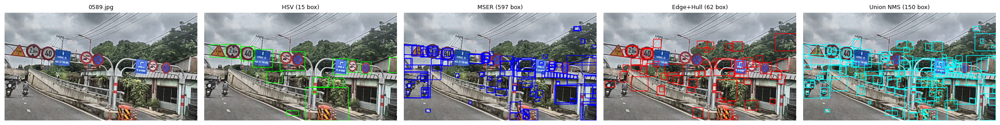

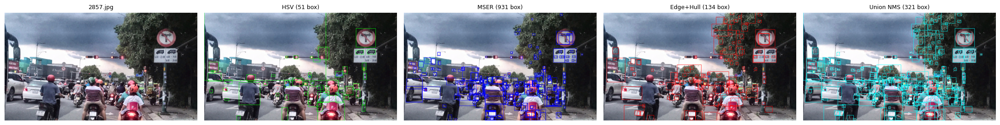

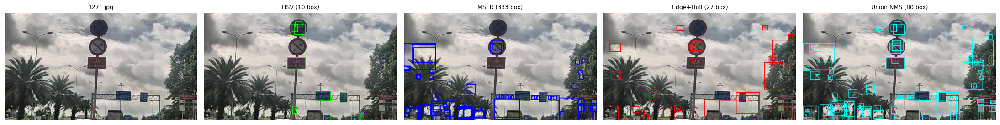

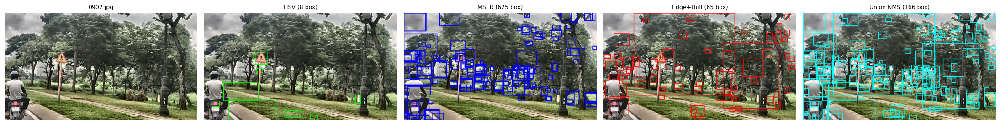

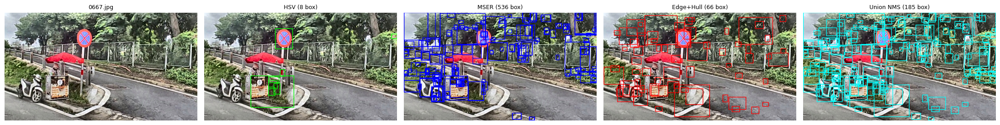

In [15]:
from src.task2_union import (
    hsv_boxes,
    mser_boxes,
    edge_shape_boxes_hull,
    build_union_boxes,
)

for img_bgr, title in zip(survey_images, survey_titles):
    union_boxes, components = build_union_boxes(img_bgr)

    vis_hsv   = draw_boxes(img_bgr, components["hsv"],       color=(0, 255, 0))
    vis_mser  = draw_boxes(img_bgr, components["mser"],      color=(255, 0, 0))
    vis_edge  = draw_boxes(img_bgr, components["edge_hull"], color=(0, 0, 255))
    vis_union = draw_boxes(img_bgr, union_boxes,              color=(255, 255, 0))

    show_images(
        [img_bgr, vis_hsv, vis_mser, vis_edge, vis_union],
        [title,
         f"HSV ({len(components['hsv'])} box)",
         f"MSER ({len(components['mser'])} box)",
         f"Edge+Hull ({len(components['edge_hull'])} box)",
         f"Union NMS ({len(union_boxes)} box)"],
        figsize=(22, 5)
    )

## 7.2. Đánh giá định lượng lại cho từng nhánh

In [16]:
from src.task2_union import build_union_boxes

results = {
    "HSV (Set 1)":          evaluate_boxes(eval_paths, LABEL_DIR, lambda img: hsv_boxes(img, set_number=1)),
    "MSER (delta=5)":       evaluate_boxes(eval_paths, LABEL_DIR, lambda img: mser_fn(img, 5)),
    "Canny+Hull (50,150)": evaluate_boxes(eval_paths, LABEL_DIR, lambda img: canny_fn(img, 50, 150)),
    "Union NMS (cả 3)":     evaluate_boxes(eval_paths, LABEL_DIR, lambda img: build_union_boxes(img)[0]),
}
print_eval_table(results)

Phuong an              | Recall (IoU>=0.3)    | Precision    | Avg box/anh    | So anh co GT
-------------------------------------------------------------------------------------------------
HSV (Set 1)            | 0.4031               | 0.0674       | 15.59          | 99
MSER (delta=5)         | 0.6279               | 0.0030       | 542.82         | 99
Canny+Hull (50,150)    | 0.3760               | 0.0150       | 65.38          | 99
Union NMS (cả 3)       | 0.7791               | 0.0119       | 170.03         | 99


Union NMS đã cải thiện đáng kể recall -> Chọn phương pháp kết hợp này là đúng

# 7.3. Khảo sát bộ lọc ar_range/min_extent mới cho hsv_boxes/mser_boxes

In [17]:
CANDIDATES = {
    "baseline (khong loc)": dict(
        hsv_ar_range=(0.0, 999.0), hsv_min_extent=0.0,
        mser_ar_range=(0.0, 999.0), mser_min_extent=0.0,
    ),
    "ar=0.4-2.5, ext=0.15": dict(
        hsv_ar_range=(0.4, 2.5), hsv_min_extent=0.15,
        mser_ar_range=(0.6, 1.6), mser_min_extent=0.15,
    ),
    "ar=0.4-2.5, ext=0.25 (de xuat)": dict(
        hsv_ar_range=(0.4, 2.5), hsv_min_extent=0.25,
        mser_ar_range=(0.6, 1.6), mser_min_extent=0.2,
    ),
    "ar=0.4-2.5, ext=0.35 (siet hon)": dict(
        hsv_ar_range=(0.4, 2.5), hsv_min_extent=0.35,
        mser_ar_range=(0.6, 1.6), mser_min_extent=0.3,
    ),
    "ar=0.5-2.0, ext=0.25 (siet ar)": dict(
        hsv_ar_range=(0.5, 2.0), hsv_min_extent=0.25,
        mser_ar_range=(0.6, 1.6), mser_min_extent=0.2,
    ),
}
results = {
    label: evaluate_boxes(
        eval_paths, LABEL_DIR,
        lambda img, kw=kwargs: build_union_boxes(img, **kw)[0],
    )
    for label, kwargs in CANDIDATES.items()
}
print_eval_table(results)

Phuong an              | Recall (IoU>=0.3)    | Precision    | Avg box/anh    | So anh co GT
-------------------------------------------------------------------------------------------------
baseline (khong loc)   | 0.7984               | 0.0088       | 237.47         | 99
ar=0.4-2.5, ext=0.15   | 0.7868               | 0.0118       | 173.12         | 99
ar=0.4-2.5, ext=0.25 (de xuat) | 0.7791               | 0.0119       | 170.03         | 99
ar=0.4-2.5, ext=0.35 (siet hon) | 0.7752               | 0.0127       | 159.05         | 99
ar=0.5-2.0, ext=0.25 (siet ar) | 0.7713               | 0.0120       | 168.06         | 99


In [18]:
chosen_params = CANDIDATES["ar=0.4-2.5, ext=0.15"]
print("Đã chọn", chosen_params)

Đã chọn {'hsv_ar_range': (0.4, 2.5), 'hsv_min_extent': 0.15, 'mser_ar_range': (0.6, 1.6), 'mser_min_extent': 0.15}


- Giai đoạn lọc ứng viên -> box loại sai là mất vĩnh viễn, nên Recall quan trọng hơn Precision.
- ext=0.15 giảm  giảm số bõ từ 237->173 mà chỉ mất 0,0116 điểm recall.
- ext=0.25 mất recall nhiều hơn nhưng so với ext = 0.15 nhưng chỉ giảm thêm 3 box/ảnh -> không đáng.
- ext=0.35 làm giảm số box đáng kể nhưng cũng làm mất đi recall. Tiêu chí là iuwx recall ở mức cao nhất nhất nên cách này vẫn bị loại.
- ar = 0.5-2.0 & ext = 0.25 kết quả không tốt bằng những tham số trên.
-> chọn ar=0.4-2.5, ext = 0.15

# 8. Xuất box JSON cho toàn bộ dataset (đầu vào Task 5)

In [19]:
UNION_OUTPUT_DIR = PROJECT_ROOT / "data" / "processed" / "task2_union_boxes" / "boxes"
UNION_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

all_image_paths = list_image_paths(PROCESSED_IMAGE_DIR)
print(f"Bắt đầu xử lý {len(all_image_paths)} ảnh với build_union_boxes (chosen_params={chosen_params})...")

summary = {}
for path in all_image_paths:
    img = cv2.imread(str(path))
    if img is None:
        continue
    union_boxes, _ = build_union_boxes(img, **chosen_params)
    box_list = [{"bounding_box": [int(x), int(y), int(w), int(h)]} for (x, y, w, h) in union_boxes]

    json_path = UNION_OUTPUT_DIR / f"{path.stem}.json"
    with open(json_path, "w", encoding="utf-8") as f:
        json.dump(box_list, f)
    summary[path.name] = len(box_list)

print(f"Đã xử lý {len(all_image_paths)} ảnh -> {UNION_OUTPUT_DIR}")
print(f"Trung bình box/ảnh: {sum(summary.values())/len(summary):.1f}")

Bắt đầu xử lý 2532 ảnh với build_union_boxes (chosen_params={'hsv_ar_range': (0.4, 2.5), 'hsv_min_extent': 0.15, 'mser_ar_range': (0.6, 1.6), 'mser_min_extent': 0.15})...
Đã xử lý 2532 ảnh -> c:\Users\lengo\Downloads\Python\Computer Vision\Project\data\processed\task2_union_boxes\boxes
Trung bình box/ảnh: 198.7


# 9. Cập nhật config.yaml

In [ ]:
from src.data_loader import save_config

with open(CONFIG_PATH, "r", encoding="utf-8") as f:
    cfg = yaml.safe_load(f)

cfg.setdefault("task2_union", {})
cfg["task2_union"]["nms_iou_thresh"] = 0.4
cfg["task2_union"]["hsv_set_used"] = 1
cfg["task2_union"]["mser_delta_used"] = 5
cfg["task2_union"]["canny_low_used"] = 50
cfg["task2_union"]["canny_high_used"] = 150

cfg["task2_union"]["hsv_ar_range"]    = list(chosen_params["hsv_ar_range"])
cfg["task2_union"]["hsv_min_extent"]  = chosen_params["hsv_min_extent"]
cfg["task2_union"]["mser_ar_range"]   = list(chosen_params["mser_ar_range"])
cfg["task2_union"]["mser_min_extent"] = chosen_params["mser_min_extent"]

save_config(cfg, CONFIG_PATH)
print("Đã lưu config.yaml — task2_union:", cfg["task2_union"])

Đã lưu config.yaml — task2_union: {'canny_high_used': 150, 'canny_low_used': 50, 'eval_avg_box_per_image': 159.19, 'eval_precision': 0.0115, 'eval_recall': 0.7868, 'hsv_ar_range': [0.4, 2.5], 'hsv_min_extent': 0.15, 'hsv_set_used': 1, 'mser_ar_range': [0.6, 1.6], 'mser_delta_used': 5, 'mser_min_extent': 0.15, 'nms_iou_thresh': 0.4}
